In [3]:
# --- Core libraries ---
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import geopandas as gpd
from shapely.geometry import Point
from tabulate import tabulate
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point 
import category_encoders as ce
from sklearn.inspection import permutation_importance

# --- Scikit-learn: model training, preprocessing, CV, evaluation ---
from sklearn.model_selection import (
    GroupKFold,
    RandomizedSearchCV,
    cross_validate,
    train_test_split,
    GridSearchCV
)
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    balanced_accuracy_score,
    roc_auc_score,
    make_scorer,
    ConfusionMatrixDisplay
)
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import BallTree
from sklearn.feature_selection import RFE 
from sklearn.feature_selection import RFECV

# --- XGBoost ---
from xgboost import XGBRegressor, plot_tree, plot_importance
import xgboost as xgb # Optional: useful for checking version

# --- Other ---
from haversine import haversine
import scipy.stats as stats
import gstools as gs #variogram modeling
from sklearn.metrics import pairwise_distances # for distance calculations
from scipy.cluster.hierarchy import linkage, dendrogram #for hierarchical clustering dendrogram
from sklearn.cluster import AgglomerativeClustering #for hierarchical clustering
from sklearn.cluster import DBSCAN



#--- Custom Functions as defined by the user ---
import sys
sys.path.append(os.path.abspath("../tools"))
import functions



In [4]:
print("Current working directory:", os.getcwd())

#load in 
df = pd.read_csv("../../../../data/finaldatasets/testdata/finalfr/finalfrfr/jittered_eng_cleaned.csv")  # for variogram, etc.
print(list(df.columns))



Current working directory: /home/sebastian-dohne/Documents/FinalProject/code/analysis/kagglefeatureengineering/xgboost
['id', 'Data.ID', 'Location', 'State.Region.County.Province', 'Country', 'Continent', 'Latitude..N.S.', 'Longitude..E.W.', 'Conversion.for.latitude', 'Conversion.for.longitude', 'Location.source', 'Observation.period', 'Crop.variety', 'Tillage.type', 'Treatment', 'Treatment.type', 'Grain.yield..tons.ha.1.', 'Soil.type', 'N.rate..kg.N.ha.1.', 'Pest.prescence....64', 'Pest.detected...65', 'start_date', 'end_date', 'Treatment_Category', 'N_Category', 'year', 'Fungicides_and_Bactericides_use.t.', 'Herbicides_use.t.', 'Insecticides_use.t.', 'Pesticides_t.', 'Pesticides_.total._.t.', 'Pesticides.total.kg.ha.', 'gdp_per_capita', 'group_id', 'jitter_radius_km', 'latitude_jittered', 'longitude_jittered', 'prc1', 'prc2', 'prc3', 'prc4', 'prc5', 'prc6', 'prc7', 'prc8', 'prc9', 'NDVI1', 'NDVI2', 'NDVI3', 'NDVI4', 'NDVI5', 'NDVI6', 'NDVI7', 'NDVI8', 'NDVI9', 'Evap1', 'Evap2', 'Evap

/tmp/ipykernel_377722/17258526.py:4: DtypeWarning: Columns (13,14,15,17,19,20,23,24) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../../../../data/finaldatasets/testdata/finalfr/finalfrfr/jittered_eng_cleaned.csv")  # for variogram, etc.


In [5]:
# Define groups of columns to drop
LOCATION_COLS = [
    "id", "Data.ID", "State.Region.County.Province", "Continent","Country",
    "Latitude..N.S.", "Longitude..E.W.", "group", "sowing_year",
    "Observation.period.1", "Observation.period.2", "lat", "lon",
    "Location.source", "X", "Y", "unit_code", "Year_x",
    "latitude_jittered","longitude_jittered", "jitter_radius_km", "group_id"
]

# "Conversion.for.latitude", "Conversion.for.longitude"
HIGH_CARDINALITY_COLS = [
    "Treatment.type", "Emissions..yes.no.", "start_date"
    "Irrigation..mm.", "Harvesting.date.1","Pest.severity.score.......66",
    "Agricultural_Use_–_Other_Pesticides_nes_(t)","Agricultural_Use_–_Rodenticides_(t)", 
    "irr_end_date", "end_date", "rainfed_end_date"
]


COLLINEAR_COLS = [
    "harvest_month", "harvest_date_clean", "harvest_week",
    "Planting.date", "Planting_Month", "Planting.date.1", "Planting_Week"
]

# These columns are used for testing purposes
TESTCOLUMNS = [
    "gdp", "hdi", "irr_start_date",
    "rainfed_start_date", "Agricultural_Use_._Rodenticides_.t.",
    "Mean.annual.precipitation..mm.", "irrigation_applied", "Sand", "start_date",
    "Irrigation.mm_clean", "Mean.annual.temperature..Â.C.", "Irrigation.mm_clean", "Wheat.Type", 
]


# Combine all columns to drop into a single set (to avoid duplicates)
COLUMNS_TO_DROP = set(LOCATION_COLS + HIGH_CARDINALITY_COLS + COLLINEAR_COLS + TESTCOLUMNS)

# Drop all listed columns if they exist in the DataFrame
df_cleaned = df.drop(columns=[col for col in COLUMNS_TO_DROP if col in df.columns])

# Optional: Review dropped and remaining columns
print("Original shape:", df.shape)
print("Shape after dropping:", df_cleaned.shape)
print("Dropped columns:", [col for col in COLUMNS_TO_DROP if col in df.columns])
print("Remaining columns:", df_cleaned.columns.tolist())

# Drop columns with less than 20% completeness
df_cleaned = df_cleaned.loc[:, df_cleaned.count() / len(df_cleaned) >= 0.2]

# Drop unnamed columns and rows with NaN in the target variable
df_cleaned = df_cleaned.loc[:, ~df_cleaned.columns.str.contains('^Unnamed')]
df_cleaned = df_cleaned.dropna(subset=["Grain.yield..tons.ha.1."])


Original shape: (22709, 149)
Shape after dropping: (22709, 132)
Dropped columns: ['end_date', 'id', 'Country', 'latitude_jittered', 'jitter_radius_km', 'Data.ID', 'longitude_jittered', 'sowing_year', 'Latitude..N.S.', 'Continent', 'State.Region.County.Province', 'Longitude..E.W.', 'Location.source', 'Sand', 'start_date', 'group_id', 'Treatment.type']
Remaining columns: ['Location', 'Conversion.for.latitude', 'Conversion.for.longitude', 'Observation.period', 'Crop.variety', 'Tillage.type', 'Treatment', 'Grain.yield..tons.ha.1.', 'Soil.type', 'N.rate..kg.N.ha.1.', 'Pest.prescence....64', 'Pest.detected...65', 'Treatment_Category', 'N_Category', 'year', 'Fungicides_and_Bactericides_use.t.', 'Herbicides_use.t.', 'Insecticides_use.t.', 'Pesticides_t.', 'Pesticides_.total._.t.', 'Pesticides.total.kg.ha.', 'gdp_per_capita', 'prc1', 'prc2', 'prc3', 'prc4', 'prc5', 'prc6', 'prc7', 'prc8', 'prc9', 'NDVI1', 'NDVI2', 'NDVI3', 'NDVI4', 'NDVI5', 'NDVI6', 'NDVI7', 'NDVI8', 'NDVI9', 'Evap1', 'Evap2', 

In [6]:
functions.summarize_dataframe(df_cleaned)

| variable                           | dtype   |   count |   pct_complete |   n_unique |
|------------------------------------|---------|---------|----------------|------------|
| Location                           | object  |   22709 |          100   |        228 |
| Trans1                             | float64 |   22709 |          100   |       1075 |
| Elevation                          | int64   |   22709 |          100   |       1555 |
| Trans9                             | float64 |   22709 |          100   |       1070 |
| Trans8                             | float64 |   22709 |          100   |       1070 |
| Trans7                             | float64 |   22709 |          100   |       1056 |
| Trans6                             | float64 |   22709 |          100   |       1047 |
| Trans5                             | float64 |   22709 |          100   |       1008 |
| Trans4                             | float64 |   22709 |          100   |       1015 |
| Trans3             

In [7]:
df_cleaned = df_cleaned.loc[:, df_cleaned.notna().mean() >= 0.5]

### encoding cols and preparing data

check object datatypes 

In [8]:
#see how many labels there are before doing rf: 
df_cleaned.select_dtypes(include="object").nunique().sort_values(ascending=False)


Crop.variety            900
Location                228
Treatment_Category       14
Pest.prescence....64      2
dtype: int64

define a function that encodes object columns accordingly, above the threshold binary encoding is applied

In [9]:
def encode_features_no_target_split(df, cardinality_threshold=50):
   """
   Auto-encode: >50 unique = binary, ≤50 unique = one-hot
   """
   
   df_encoded = df.copy()
   target_col = "Grain.yield..tons.ha.1."
   
   # Get categorical columns
   categorical_cols = df_encoded.select_dtypes(include=['object', 'category']).columns.tolist()
   if target_col in categorical_cols:
       categorical_cols.remove(target_col)
   
   # Separate by cardinality
   onehot_cols = []
   binary_cols = []
   
   for col in categorical_cols:
       if df_encoded[col].nunique() <= cardinality_threshold:
           onehot_cols.append(col)
       else:
           binary_cols.append(col)
   
   # Apply encodings
   if onehot_cols:
       df_encoded = pd.get_dummies(df_encoded, columns=onehot_cols, drop_first=False)
   
   if binary_cols:
       be = ce.BinaryEncoder(cols=binary_cols)
       df_encoded = be.fit_transform(df_encoded)
   
   # Make numeric (except target)
   for col in df_encoded.columns:
       if col != target_col:
           df_encoded[col] = df_encoded[col].astype(float)
   
   return df_encoded

# Usage:
# 1. Encode FULL dataset (keeps target column)
df_encoded_full = encode_features_no_target_split(df_cleaned, cardinality_threshold=50)

create a holdout set past 2018 that is pre-encoded 

In [10]:
# Step 1: Create unique lat/lon identifier
df_encoded_full['lat_lon_id'] = df_encoded_full['Conversion.for.latitude'].astype(str) + '_' + df_encoded_full['Conversion.for.longitude'].astype(str)

# Step 2: Identify lat/lon combinations that ONLY have data after 2018
future_only_coords = (
   df_encoded_full.groupby("lat_lon_id")["Observation.period"]
   .min()
   .gt(2018)
)

future_coord_ids = future_only_coords[future_only_coords].index.tolist()
print(f"Number of future-only coordinate combinations: {len(future_coord_ids)}")

# Step 3: Extract future holdout data
future_holdout = df_encoded_full[df_encoded_full["lat_lon_id"].isin(future_coord_ids)]

# Step 4: Create training dataset (remove future-only coordinates)
df_encoded_full = df_encoded_full[~df_encoded_full["lat_lon_id"].isin(future_coord_ids)]

# Step 5: Drop the temporary lat_lon_id column
df_encoded_full = df_encoded_full.drop(columns=["lat_lon_id"])
future_holdout = future_holdout.drop(columns=["lat_lon_id"])

Number of future-only coordinate combinations: 17


/tmp/ipykernel_377722/1390316218.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_encoded_full['lat_lon_id'] = df_encoded_full['Conversion.for.latitude'].astype(str) + '_' + df_encoded_full['Conversion.for.longitude'].astype(str)


Split target variable for XGboost regression 

In [11]:
# 3. NOW split X and y consistently
X_encoded = df_encoded_full.drop("Grain.yield..tons.ha.1.", axis=1)
y = df_encoded_full["Grain.yield..tons.ha.1."]

X_holdout = future_holdout.drop("Grain.yield..tons.ha.1.", axis=1)  
y_holdout = future_holdout["Grain.yield..tons.ha.1."]

In [12]:
functions.summarize_dataframe(X_holdout)

| variable                                      | dtype   |   count |   pct_complete |   n_unique |
|-----------------------------------------------|---------|---------|----------------|------------|
| Location_0                                    | float64 |    1010 |          100   |          2 |
| Trans9                                        | float64 |    1010 |          100   |         52 |
| temp9                                         | float64 |    1010 |          100   |         45 |
| temp8                                         | float64 |    1010 |          100   |         46 |
| temp7                                         | float64 |    1010 |          100   |         46 |
| temp6                                         | float64 |    1010 |          100   |         45 |
| temp5                                         | float64 |    1010 |          100   |         46 |
| temp4                                         | float64 |    1010 |          100   |         46 |


### Agglometric clustering (space only)

The function below performs agglometric clustering in the complete form, with a distance threshold informed by a semi variogram. This way it is able to form spacial clusters of observation rows while minimising spacial autocorrelation

In [13]:
# -------------------------
# Haversine Distance Matrix
# -------------------------
def haversine_distance_matrix(coords_rad):
    lat = coords_rad[:, 0][:, np.newaxis]
    lon = coords_rad[:, 1][:, np.newaxis]

    dlat = lat - lat.T
    dlon = lon - lon.T

    a = np.sin(dlat / 2)**2 + np.cos(lat) * np.cos(lat.T) * np.sin(dlon / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return 6371 * c  # Earth's radius in km

# -------------------------
# Spatial Agglomerative Clustering (on unique locations only)
# -------------------------
def agglomerative_spatial(df, lat_col, lon_col, radius_km):
    df = df.copy()

    # 1. Extract and deduplicate valid coordinates 
    coords_df = df[[lat_col, lon_col]].dropna().drop_duplicates().reset_index(drop=False)
    coords_rad = np.radians(coords_df[[lat_col, lon_col]].values)

    # 2. Compute distance matrix and cluster
    dist_matrix = haversine_distance_matrix(coords_rad)
    model = AgglomerativeClustering(
        metric='precomputed',
        linkage='complete',
        distance_threshold=radius_km,
        n_clusters=None
    )
    labels = model.fit_predict(dist_matrix)

    # 3. Assign cluster labels to the unique coordinate rows
    coords_df['spatial_group'] = labels

    # 4. Merge labels back to the original DataFrame
    df = df.merge(coords_df[[lat_col, lon_col, 'spatial_group']], on=[lat_col, lon_col], how='left')

    # 5. Ensure spatial_group is nullable Int
    df['spatial_group'] = df['spatial_group'].astype("Int64")

    return df

In [14]:
X_encoded = agglomerative_spatial(
    X_encoded,
    lat_col='Conversion.for.latitude',
    lon_col='Conversion.for.longitude',
    radius_km=25
)


In [15]:
pd.set_option('display.max_rows', None)

X_encoded['spatial_group'].value_counts()

spatial_group
96     2345
11     2102
91     2000
35     1284
18     1256
162    1000
76     1000
70      989
21      730
6       520
118     517
161     478
149     467
36      449
126     396
59      288
50      194
106     194
52      158
34      158
33      158
86      154
94      152
64      144
121     140
156     136
45      118
53      118
26      118
128     114
93      114
60      114
90      112
63      112
141      96
165      96
49       95
19       91
22       80
57       79
16       76
142      75
154      72
12       68
5        67
78       60
83       60
82       57
151      50
20       48
65       48
155      48
101      48
102      48
2        48
0        47
58       44
148      42
54       42
23       40
44       40
38       40
27       40
31       40
46       40
29       40
13       38
75       36
30       36
66       36
110      36
71       35
119      33
157      33
1        32
7        31
166      30
120      30
4        29
32       28
8        27
39       25
88

#### Dealing with spacial domination in the dataset

A greedy kfold clustering mechanism was implemented, which groups spacial clusters together into 10 neat KFolds for cross validation

In [16]:
def create_balanced_folds(df, spatial_col='spatial_group', n_folds=10):
    """Create balanced fold assignments from dataframe with spatial groups."""
    # Get group counts
    group_counts = df.groupby(spatial_col).size().reset_index()
    group_counts.columns = ['spatial_group', 'count']
    
    # Sort largest first
    sorted_groups = group_counts.sort_values('count', ascending=False)
    
    # Assign groups to folds (greedy)
    fold_sizes = [0] * n_folds
    group_to_fold = {}
    
    for _, row in sorted_groups.iterrows():
        min_fold = np.argmin(fold_sizes)
        fold_sizes[min_fold] += row['count']
        group_to_fold[row['spatial_group']] = min_fold
    
    # Add fold_group column
    df = df.copy()
    df['fold_group'] = df[spatial_col].map(group_to_fold)
    
    # Print results
    total_obs = len(df)
    print(f"Total: {total_obs} obs, Target per fold: {total_obs/n_folds:.0f}")
    for i, size in enumerate(fold_sizes):
        print(f"Fold {i + 1}: {size} obs")
    
    return df

In [17]:
df_with_folds = create_balanced_folds(X_encoded, spatial_col='spatial_group', n_folds=10)

combined_groups = df_with_folds['fold_group'].values

Total: 21699 obs, Target per fold: 2170
Fold 1: 2345 obs
Fold 2: 2149 obs
Fold 3: 2151 obs
Fold 4: 2151 obs
Fold 5: 2150 obs
Fold 6: 2151 obs
Fold 7: 2151 obs
Fold 8: 2151 obs
Fold 9: 2150 obs
Fold 10: 2150 obs


Define Training and testing set (prepare for agony)

In [18]:
functions.summarize_dataframe(X_encoded)

| variable                                      | dtype   |   count |   pct_complete |   n_unique |
|-----------------------------------------------|---------|---------|----------------|------------|
| Location_0                                    | float64 |   21699 |          100   |          2 |
| Trans9                                        | float64 |   21699 |          100   |       1030 |
| temp9                                         | float64 |   21697 |          100   |        633 |
| temp8                                         | float64 |   21697 |          100   |        627 |
| temp7                                         | float64 |   21697 |          100   |        625 |
| temp6                                         | float64 |   21697 |          100   |        629 |
| temp5                                         | float64 |   21697 |          100   |        626 |
| temp4                                         | float64 |   21697 |          100   |        625 |


In [19]:
# Define the seed for reproducibility
SEED = 42
np.random.seed(SEED)

# Drop only columns that exist in X_encoded
cols_to_drop = ["Conversion.for.latitude", "Conversion.for.longitude", "spatial_group", "fold_group", "Location", "lat_lon_id"]
X_encoded = X_encoded.drop(columns=[col for col in cols_to_drop if col in X_encoded.columns])


X_trainval, X_test, y_trainval, y_test, groups_trainval, groups_test = train_test_split(
    X_encoded,
    y,
    combined_groups,
    test_size=0.15,
    random_state=SEED,
    stratify=None  # Remove or set to None if group balance is poor
)

print(f"Train/Validation size: {X_trainval.shape[0]}")
print(f"Holdout test size:     {X_test.shape[0]}")


Train/Validation size: 18444
Holdout test size:     3255


### Attempting to implement recursive feature elimination 

In [22]:
# Define scoring metrics for evaluation
scoring = {
    'mae': 'neg_mean_absolute_error',
    'rmse': 'neg_root_mean_squared_error',
    'r2': 'r2'
}

# Set up cross-validation with grouping
cv = GroupKFold(n_splits=10)

# Base XGBoost model (used in search)
xgb_model = XGBRegressor(
    objective="reg:squarederror",
    tree_method="hist",
    missing=np.nan,
    n_jobs= 4,
    random_state=SEED
)

# Define hyperparameter search space
param_dist = {
    "n_estimators": np.arange(100, 1000, 100),
    "max_depth": np.arange(3, 11),
    "learning_rate": np.logspace(-3, -0.3, 20),
    "subsample": [0.6, 0.7, 0.8, 0.9, 1.0],
    "colsample_bytree": [0.6, 0.8, 1.0],
    "reg_alpha": np.logspace(-4, 1, 10),
    "reg_lambda": np.logspace(-3, 1, 10),
    "min_child_weight": np.arange(1, 12),
    "gamma": np.logspace(-4, 0, 12),
}

# Step 1: Hyperparameter tuning on full features
search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=20,
    scoring=scoring,
    refit='mae',  # ← Choose which metric to optimize
    cv=cv.split(X_trainval, y_trainval, groups=groups_trainval),
    verbose=1,
    n_jobs= 4,
    random_state=SEED
)

search.fit(X_trainval, y_trainval)
best_params = search.best_params_

# Step 2: RFECV with 5-fold CV and step=5 for faster performance
cv_5fold = GroupKFold(n_splits=5)

rfecv = RFECV(
    estimator=XGBRegressor(
        **best_params,
        objective="reg:squarederror", 
        tree_method="hist",
        missing=np.nan,
        n_jobs= 4,
        random_state=SEED
    ),
    cv=cv_5fold.split(X_trainval, y_trainval, groups=groups_trainval),
    scoring='neg_mean_absolute_error',
    step=5,  # ← Eliminate 5 features at each step
    min_features_to_select=50
)

X_trainval_selected = rfecv.fit_transform(X_trainval, y_trainval)
X_test_selected = rfecv.transform(X_test)

print(f"Features selected: {X_trainval.shape[1]} → {X_trainval_selected.shape[1]}")

# Step 3: Final model tuning on selected features
search_final = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=20,
    scoring=scoring,
    refit='mae',  
    cv=cv.split(X_trainval_selected, y_trainval, groups=groups_trainval),
    verbose=1,
    n_jobs=2,
    random_state=SEED
)

search_final.fit(X_trainval_selected, y_trainval)
best_model = search_final.best_estimator_


Fitting 10 folds for each of 20 candidates, totalling 200 fits
Features selected: 144 → 104
Fitting 10 folds for each of 20 candidates, totalling 200 fits


In [23]:
print("Best parameters (initial search):")
print(search.best_params_)

print("\nBest parameters (final search):")
print(search_final.best_params_)

Best parameters (initial search):
{'subsample': 1.0, 'reg_lambda': 0.021544346900318832, 'reg_alpha': 0.05994842503189409, 'n_estimators': 300, 'min_child_weight': 7, 'max_depth': 6, 'learning_rate': 0.013703834506631679, 'gamma': 0.0001, 'colsample_bytree': 0.6}

Best parameters (final search):
{'subsample': 1.0, 'reg_lambda': 10.0, 'reg_alpha': 0.016681005372000592, 'n_estimators': 600, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.002668798528338159, 'gamma': 1.0, 'colsample_bytree': 0.6}


IndexError: index -84 is out of bounds for axis 0 with size 20

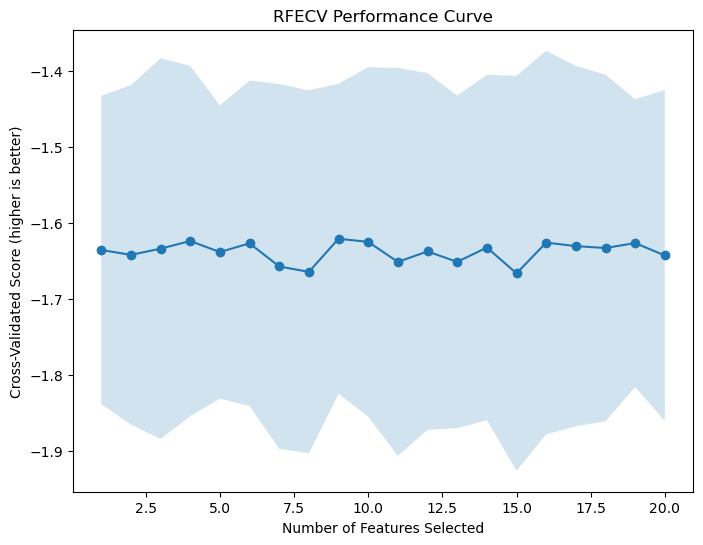

In [59]:
# Number of features tested at each step (descending)
n_features = np.arange(len(rfecv.cv_results_['mean_test_score']), 0, -1)

# Mean cross-validated score (e.g., negative MAE)
mean_scores = rfecv.cv_results_['mean_test_score']
std_scores = rfecv.cv_results_['std_test_score']

plt.figure(figsize=(8, 6))
plt.title("RFECV Performance Curve")
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated Score (higher is better)")

# Plot mean score curve
plt.plot(n_features, mean_scores, marker='o', label='Mean CV Score')

# Optional: plot shaded std dev area
plt.fill_between(
    n_features,
    mean_scores - std_scores,
    mean_scores + std_scores,
    alpha=0.2
)

# Mark the best number of features
best_n = rfecv.n_features_
best_score = mean_scores[len(mean_scores) - best_n]
plt.axvline(x=best_n, color='red', linestyle='--', label=f'Optimal # features = {best_n}')

plt.gca().invert_xaxis()  # Because features reduce from all to few
plt.legend()
plt.show()

Final model running

In [ ]:
# Use best parameters from random search
best_params = search.best_params_

# Build final model with selected features
best_model = XGBRegressor(
    **best_params,
    objective="reg:squarederror",
    tree_method="hist",
    missing=np.nan,
    n_jobs=os.cpu_count() - 1,
    random_state=0
)

# Fit on reduced feature set
start_time = time.time()
best_model.fit(X_trainval_selected, y_trainval)  # ← Use selected features
print(f"Final model trained in {(time.time() - start_time)/60:.2f} minutes.")

# Predict using selected features
y_pred = best_model.predict(X_test_selected)

# Evaluation
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

### Plots

CV Set Evaluation Metrics:
  MAE : 0.8657
  RMSE: 1.1862
  R²  : 0.7178


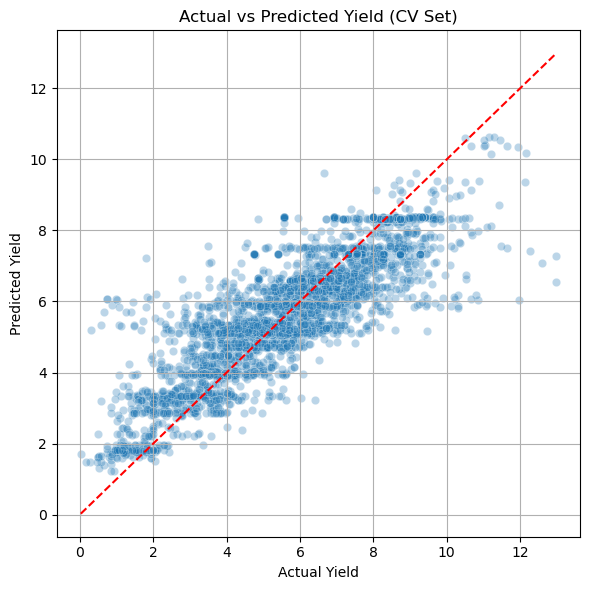

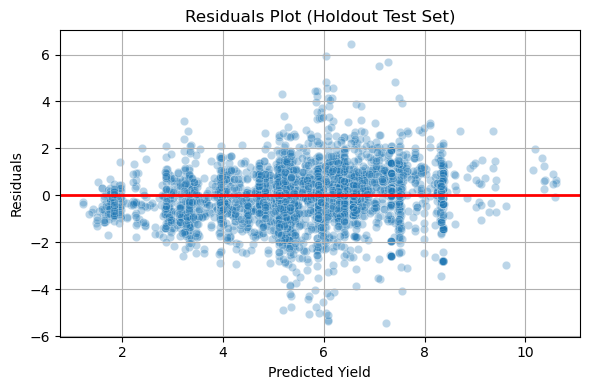

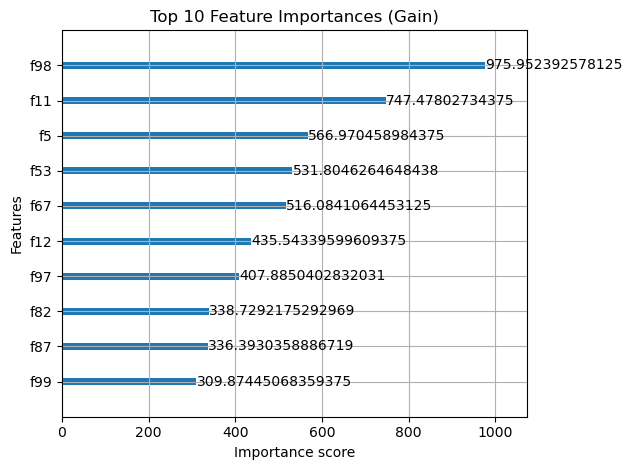

: 

In [25]:
print("CV Set Evaluation Metrics:")
print(f"  MAE : {mae:.4f}")
print(f"  RMSE: {rmse:.4f}")
print(f"  R²  : {r2:.4f}")

# Actual vs Predicted Plot
plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='red')
plt.xlabel("Actual Yield")
plt.ylabel("Predicted Yield")
plt.title("Actual vs Predicted Yield (CV Set)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Residuals Plot
residuals = y_test - y_pred
plt.figure(figsize=(6, 4))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.3)
plt.axhline(0, color='red', linestyle='-', linewidth=2)
plt.xlabel("Predicted Yield")
plt.ylabel("Residuals")
plt.title("Residuals Plot (Holdout Test Set)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Feature Importance (XGBoost native)
xgb.plot_importance(best_model, importance_type='gain', max_num_features=10)
plt.title("Top 10 Feature Importances (Gain)")
plt.tight_layout()
plt.show()


# SHAP Explanation (on test data or a sample subset)
explainer = shap.Explainer(best_model)
shap_values = explainer(X_test)

# Feature importance from SHAP values
feature_importance = np.abs(shap_values.values).mean(axis=0)
top_features = np.argsort(feature_importance)[::-1][:10]
top_feature_names = np.array(shap_values.feature_names)[top_features]

# SHAP Summary: Bar Plot
shap.plots.bar(shap_values)

# SHAP Summary: Beeswarm Plot
shap.summary_plot(shap_values)

# SHAP Summary: violin plot
shap.plots.violin(shap_values, plot_type="layered_violin")  # explains one prediction

#SHAP Summary: Ordered heatmap according to increasing yield
order = np.argsort(y_pred)
shap.plots.heatmap(shap_values,instance_order=order)

### test holdout data

Holdout prepared: (1010, 144)
Final model trained in 0.09 minutes.
Holdout Test Set Evaluation Metrics:
  MAE : 1.3449
  RMSE: 1.7164
  R²  : 0.3694


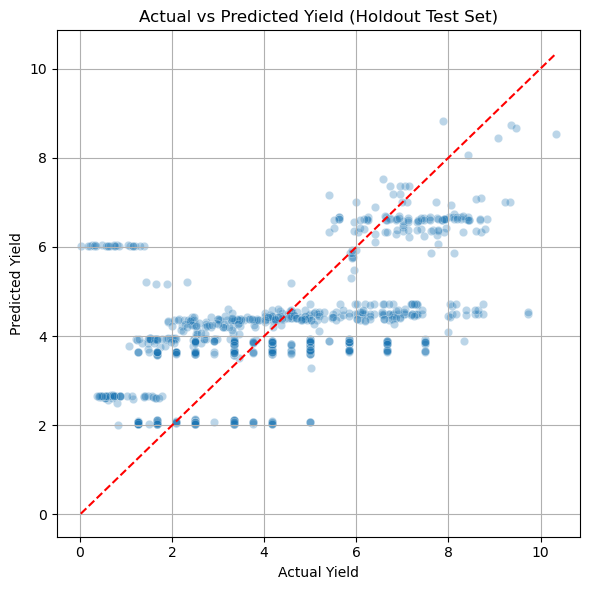

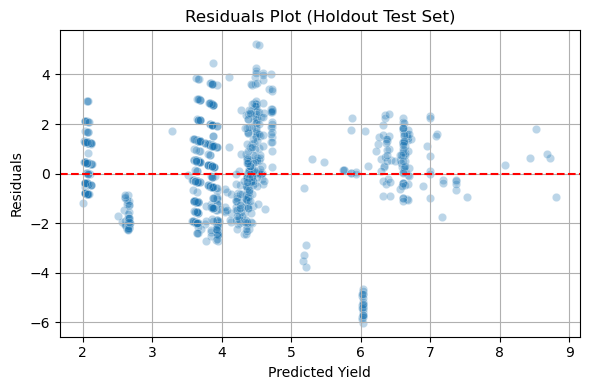

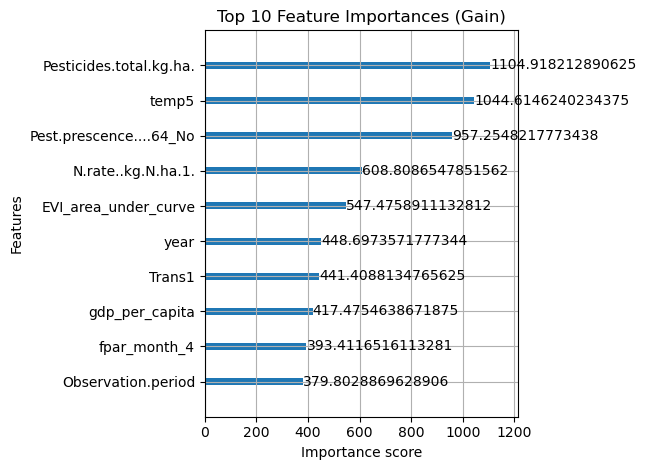

/tmp/ipykernel_267815/1054307104.py:84: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_holdout, plot_type="bar")


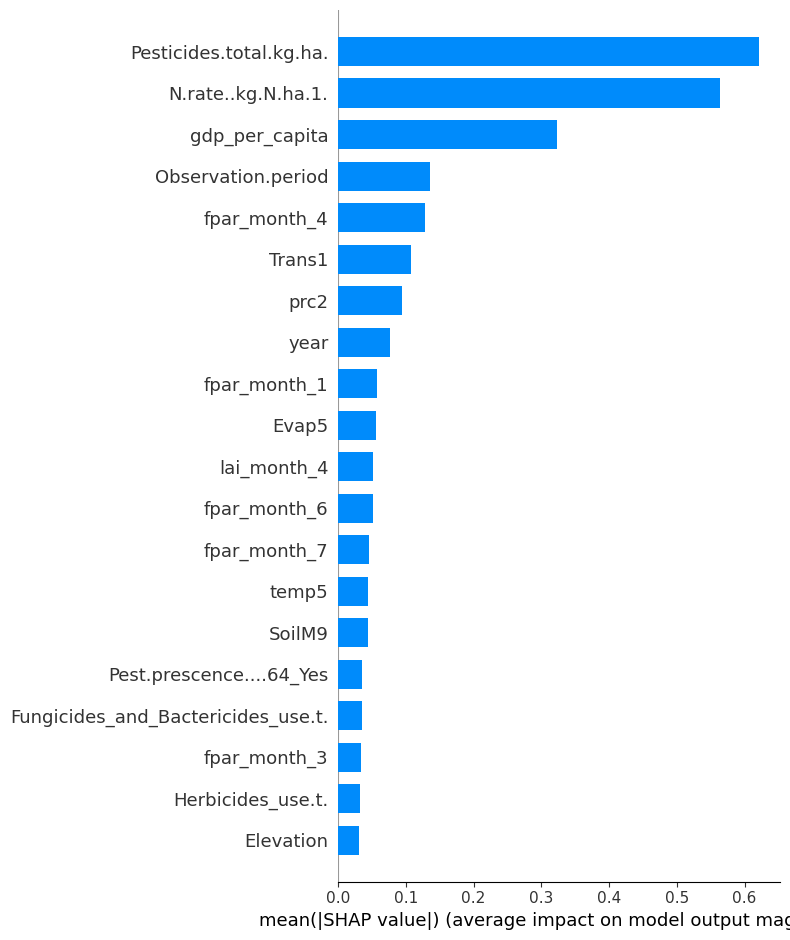

/tmp/ipykernel_267815/1054307104.py:87: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_holdout)


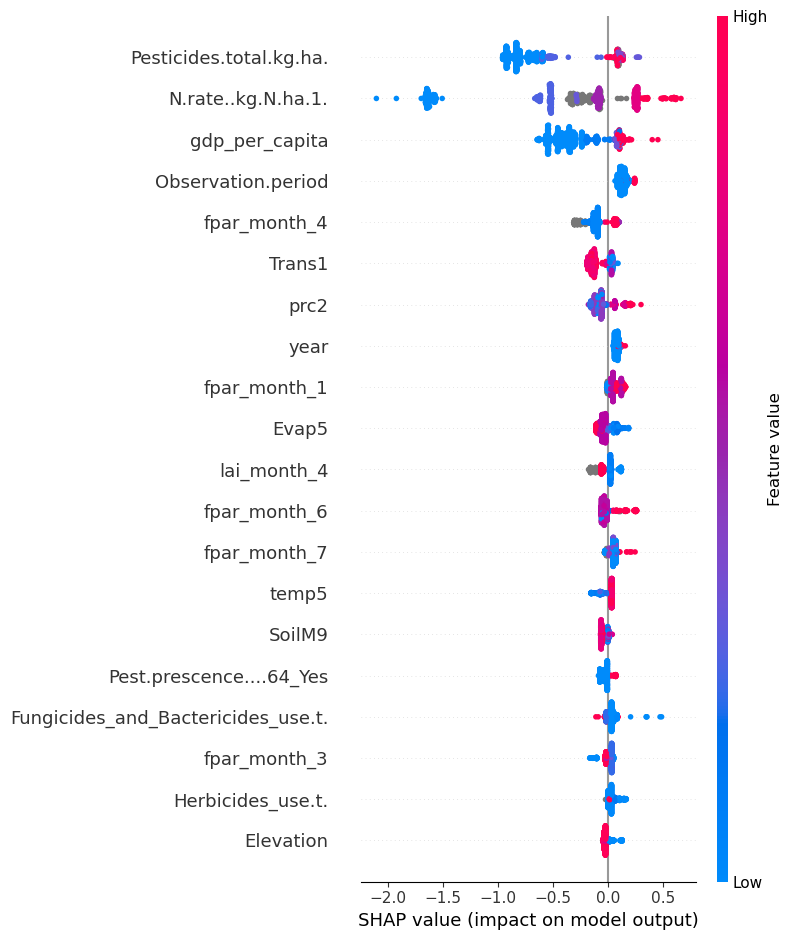

In [ ]:

# Align features with training data
train_features = set(X_trainval.columns)
holdout_features = set(X_holdout.columns)

# Add missing features as zeros
missing_features = train_features - holdout_features
for feature in missing_features:
    X_holdout[feature] = 0

# Remove extra features
extra_features = holdout_features - train_features
X_holdout = X_holdout.drop(columns=extra_features)

# Match column order and make numeric
X_holdout = X_holdout[X_trainval.columns].astype(float)

print(f"Holdout prepared: {X_holdout.shape}")

# Use best parameters from random search
best_params = search.best_params_

# Build final model
best_model = XGBRegressor(
    **best_params,
    objective="reg:squarederror",
    tree_method="hist",
    missing=np.nan,
    n_jobs=os.cpu_count() - 1,
    random_state=0
)

# Train on full training+validation set
start_time = time.time()
best_model.fit(X_trainval, y_trainval)
print(f"Final model trained in {(time.time() - start_time)/60:.2f} minutes.")

# Predict on holdout test set
y_pred = best_model.predict(X_holdout)

# Evaluation Metrics
mae = mean_absolute_error(y_holdout, y_pred)
rmse = np.sqrt(mean_squared_error(y_holdout, y_pred))
r2 = r2_score(y_holdout, y_pred)



holdout plots

In [ ]:
print("Holdout Test Set Evaluation Metrics:")
print(f"  MAE : {mae:.4f}")
print(f"  RMSE: {rmse:.4f}")
print(f"  R²  : {r2:.4f}")

# Actual vs Predicted Plot
plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_holdout, y=y_pred, alpha=0.3)
plt.plot([y_holdout.min(), y_holdout.max()], [y_holdout.min(), y_holdout.max()], '--', color='red')
plt.xlabel("Actual Yield")
plt.ylabel("Predicted Yield")
plt.title("Actual vs Predicted Yield (Holdout Test Set)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Residuals Plot
residuals = y_holdout - y_pred
plt.figure(figsize=(6, 4))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.3)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted Yield")
plt.ylabel("Residuals")
plt.title("Residuals Plot (Holdout Test Set)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Feature Importance (XGBoost native)
xgb.plot_importance(best_model, importance_type='gain', max_num_features=10)
plt.title("Top 10 Feature Importances (Gain)")
plt.tight_layout()
plt.show()

# SHAP Explanation (on holdout data)
explainer = shap.Explainer(best_model)
shap_values = explainer(X_holdout)

# SHAP Summary: Bar Plot
shap.summary_plot(shap_values, X_holdout, plot_type="bar")

# SHAP Summary: Beeswarm Plot
shap.summary_plot(shap_values, X_holdout)

shap.plots.force(shap_values[0:1100])